In [1]:
import pandas as pd
import numpy as np
# load libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import root_mean_squared_error
from sklearn.model_selection import StratifiedGroupKFold,StratifiedShuffleSplit,KFold,train_test_split
from catboost import CatBoostRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import lightgbm as lgb
from sklearn.model_selection import KFold
import numpy as np
import lightgbm as lgb
from catboost import CatBoostRegressor
from scipy.optimize import minimize
from tqdm import tqdm
from xgboost import XGBRegressor
import copy
from sklearn.preprocessing import OneHotEncoder
from sklearn.ensemble import RandomForestRegressor
import optuna

In [ ]:
#data
train=pd.read_csv("../dataset/train_features.csv")
y=pd.read_csv("../dataset/train_labels.csv")
test=pd.read_csv("../dataset/test_features.csv")
ss=pd.read_csv("../dataset/submission_format.csv")

In [3]:
train.head(2)

,uid,age_03,urban_03,married_03,n_mar_03,edu_gru_03,n_living_child_03,migration_03,glob_hlth_03,adl_dress_03,...,rrelgimp_12,rrfcntx_m_12,rsocact_m_12,rrelgwk_12,a16a_12,a21_12,a22_12,a33b_12,a34_12,j11_12
0,aace,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.somewhat important,9.Never,9.Never,0.No,NaN,NaN,NaN,NaN,NaN,Concrete 2
1,aanz,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.very important,9.Never,1.Almost every day,0.No,NaN,NaN,NaN,NaN,NaN,Concrete 2


In [4]:
test.head(2)

,uid,age_03,urban_03,married_03,n_mar_03,edu_gru_03,n_living_child_03,migration_03,glob_hlth_03,adl_dress_03,...,rrelgimp_12,rrfcntx_m_12,rsocact_m_12,rrelgwk_12,a16a_12,a21_12,a22_12,a33b_12,a34_12,j11_12
0,abxu,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"Wood, mosaic, or other covering 1"
1,aeol,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.very important,9.Never,9.Never,1.Yes,NaN,NaN,NaN,NaN,NaN,Concrete 2


In [5]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Columns: 184 entries, uid to j11_12
dtypes: float64(140), object(44)
memory usage: 4.6+ MB


In [6]:
#let merge train and label
merged_df = pd.merge(train, y, on='uid', how='left')

In [7]:
merged_df["year"]

0       2021
1       2021
2       2016
3       2021
4       2021
        ... 
4338    2021
4339    2016
4340    2021
4341    2021
4342    2021
Name: year, Length: 4343, dtype: int64

In [8]:
#so many missing values
merged_df.isnull().sum()

uid                   0
age_03             1456
urban_03           1454
married_03         1454
n_mar_03           1482
                   ... 
a33b_12            4288
a34_12             1601
j11_12               89
year                  0
composite_score       0
Length: 186, dtype: int64

In [9]:
#lets merged test AND sample submission
merged_test = pd.merge(test, ss, on='uid', how='left')

In [10]:
merged_test["year"]

0       2016
1       2016
2       2021
3       2016
4       2021
        ... 
1100    2016
1101    2021
1102    2016
1103    2021
1104    2021
Name: year, Length: 1105, dtype: int64

<Axes: title={'center': 'Target Distribution'}, ylabel='Frequency'>

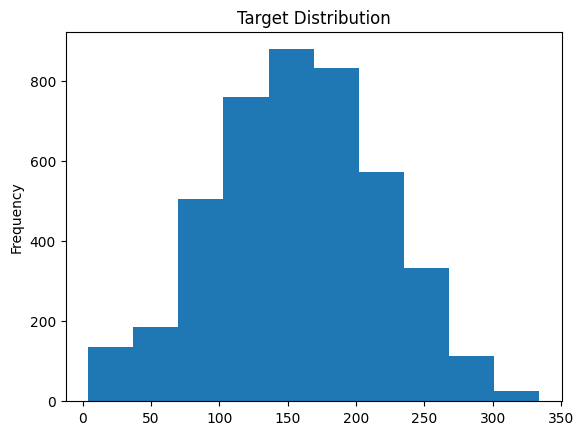

In [11]:
merged_df['composite_score'].plot(kind='hist',title='Target Distribution')

In [12]:
# create new features by combining 2003 and 2012 scores and numbering ordinal variables
def feature_engineering(data):
    data['rjob_hrswk_change'] = (data['rjob_hrswk_12'] - data['rjob_hrswk_03']).astype(float)
    data['max_work_year']=data[['rjob_end_12','rjob_end_03']].max(axis=1).astype(float)
    data['years_since_work']=(data['year']-data['max_work_year']).astype(float)
    data['hincome_change']=(data['hincome_12']-data['hincome_03']).astype(float)
    data['niadl_change']=(data['n_iadl_12']-data['n_iadl_03']).astype(float)
    data['adl_change']=(data['n_adl_12']-data['n_adl_03']).astype(float)
    data['depr_change']=(data['n_depr_12']-data['n_depr_03']).astype(float)
    data['glob_hlth_03']=data['glob_hlth_03'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
    data['glob_hlth_12']=data['glob_hlth_12'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
    data['glob_hlth_change']=(data['glob_hlth_12']-data['glob_hlth_03']).astype(float)
    data['bmi_03']=data['bmi_03'].replace({'1. Underweight': 1, '2. Normal weight': 2, '3. Overweight':3, '4. Obese':4, '5. Morbidly obese':5}).astype(float)
    data['bmi_12']=data['bmi_12'].replace({'1. Underweight': 1, '2. Normal weight': 2, '3. Overweight':3, '4. Obese':4, '5. Morbidly obese':5}).astype(float)
    data['bmi_change']=(data['bmi_12']-data['bmi_03']).astype(float)
    data['employment_03']=data['employment_03'].replace({'1. Currently Working': 'Working', '2. Currently looking for work':'Looking for work', '3. Dedicated to household chores': 'House', '4. Retired, incapacitated, or does not work': 'No work'})
    data['employment_12']=data['employment_12'].replace({'1. Currently Working': 'Working', '2. Currently looking for work':'Looking for work', '3. Dedicated to household chores': 'House', '4. Retired, incapacitated, or does not work': 'No work'})
    data['memory_12']=data['memory_12'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
    data['edu_gru_03']=data['edu_gru_03'].replace({'0. No education':0,'1. 1–5 years':1, '2. 6 years':2, '3. 7–9 years':3,'4. 10+ years':4}).astype(float)
    data['edu_gru_12']=data['edu_gru_12'].replace({'0. No education':0,'1. 1–5 years':1, '2. 6 years':2, '3. 7–9 years':3,'4. 10+ years':4}).astype(float)
    data['edu_gru_change']=(data['edu_gru_12']-data['edu_gru_03']).astype(float)
    data['illnesses_change']=(data['n_illnesses_12']-data['n_illnesses_03']).astype(float)
    return data

In [13]:
def get_cat_cols(data):
    # Get the columns with object datatype
    cat_columns=[]
    dummies=[]
    for col in data.columns:
        if data[col].dtype=='object' and 'uid' not in col:
            cat_columns.append(col)
            dummies.append(col)
        elif data[col].dtype!='object' and 'uid' not in col and (data[col].max()==1.0):
            cat_columns.append(col)
            data[col].fillna(0, inplace=True)
        else:
            continue
    return cat_columns, dummies

In [14]:
def encode_cat_cols(train_data, cat_cols, dummy_cols):
    enc = OneHotEncoder()
    enc.fit(train_data[dummy_cols])
    encoded_train_data=enc.transform(train_data[dummy_cols]).toarray()
    feature_names = enc.get_feature_names_out(dummy_cols)
    train_data.drop(columns=dummy_cols, inplace=True)
    encoded_train_df = pd.DataFrame(encoded_train_data, columns=feature_names)
    train_data[feature_names]=encoded_train_df[feature_names]
    return train_data, feature_names

In [15]:
y=merged_df['composite_score']
data_processed=pd.concat((merged_df,merged_test)).reset_index(drop=True).copy()
data_processed = feature_engineering(data_processed)
cat_cols, dummy_cols = get_cat_cols(data_processed)
data_processed, dummy_feature_names=encode_cat_cols(data_processed, cat_cols, dummy_cols)
data_processed=data_processed.drop(columns=['uid', 'composite_score'],axis=1)

for col in data_processed.columns: 
    if round((data_processed[col].isna().sum() /len(data_processed)*100), 2)>50:
        data_processed.drop(columns=col, inplace=True)
    elif round((data_processed[col].isna().sum() /len(data_processed)*100), 2)>5:
        print(col,round((data_processed[col].isna().sum() /len(data_processed)*100), 2), '% missing')
        data_processed[col].fillna(0, inplace=True)
    else: 
        data_processed[col].fillna(0, inplace=True)
        data_processed[col].fillna(0, inplace=True)

/tmp/ipykernel_1249196/2658724754.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['glob_hlth_03']=data['glob_hlth_03'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
/tmp/ipykernel_1249196/2658724754.py:11: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['glob_hlth_12']=data['glob_hlth_12'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
/tmp/ipykernel_1249196/2658724754.py:13: FutureWarning: Downcasting behavior i

n_mar_03 33.83 % missing
edu_gru_03 33.55 % missing
glob_hlth_03 36.99 % missing
n_adl_03 33.5 % missing
n_iadl_03 36.99 % missing
n_depr_03 37.1 % missing
n_illnesses_03 33.31 % missing
decis_personal_03 37.17 % missing
glob_hlth_12 5.8 % missing
n_iadl_12 5.84 % missing
n_depr_12 6.52 % missing
bmi_12 12.48 % missing
memory_12 6.72 % missing
rearnings_03 33.37 % missing
searnings_03 49.98 % missing
hincome_03 34.01 % missing
hinc_business_03 32.98 % missing
hinc_rent_03 32.98 % missing
hinc_assets_03 32.98 % missing
hinc_cap_03 32.98 % missing
rinc_pension_03 33.37 % missing
sinc_pension_03 49.98 % missing
searnings_12 35.19 % missing
sinc_pension_12 35.19 % missing
hincome_change 37.28 % missing
niadl_change 41.13 % missing
adl_change 36.4 % missing
depr_change 41.65 % missing
glob_hlth_change 41.1 % missing
edu_gru_change 36.09 % missing
illnesses_change 36.29 % missing


/tmp/ipykernel_1249196/2342792209.py:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data_processed[col].fillna(0, inplace=True)
/tmp/ipykernel_1249196/2342792209.py:15: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', t

In [16]:
y=merged_df['composite_score']
data=pd.concat((merged_df,merged_test)).reset_index(drop=True).copy()
data = feature_engineering(data)
data=data.drop(columns=['uid','composite_score'],axis=1)

# Get the columns with object datatype
object_cols = data.select_dtypes(include=['object']).columns

# Convert the object columns to category dtype
for col in object_cols:
    #data[col] = data[col].astype('category').fillna("Missing")
    data[col] = pd.Categorical(data[col].fillna("Missing"))

/tmp/ipykernel_1249196/2658724754.py:10: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['glob_hlth_03']=data['glob_hlth_03'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
/tmp/ipykernel_1249196/2658724754.py:11: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  data['glob_hlth_12']=data['glob_hlth_12'].replace({'5. Poor':0, '4. Fair':1, '3. Good':2, '2. Very good': 3, '1. Excellent':4}).astype(float)
/tmp/ipykernel_1249196/2658724754.py:13: FutureWarning: Downcasting behavior i

In [17]:
#separate train and test
merged_df_processed=data_processed[:len(merged_df)]
merged_test_processed=data_processed[len(merged_df):]

In [18]:
#separate train and test
merged_df=data[:len(merged_df)]
merged_test=data[len(merged_df):]

In [19]:
merged_df.shape

(4343, 195)

In [20]:
merged_df_processed.shape

(4343, 348)

In [21]:
# Define an objective function for Optuna for each model
def objective_lightgbm(trial, train_X, train_y, val_X, val_y):
    params = {
        'objective': 'regression',
        'metric': 'rmse',
        "random_state": 42,
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'num_leaves': trial.suggest_int('num_leaves', 20, 150),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
        'lambda_l1': trial.suggest_loguniform('lambda_l1', 1e-3, 10.0),
        'lambda_l2': trial.suggest_loguniform('lambda_l2', 1e-3, 10.0),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100)
    }

    train_data = lgb.Dataset(train_X, label=train_y)
    val_data = lgb.Dataset(val_X, label=val_y, reference=train_data)

    model = lgb.train(
        params,
        train_data,
        valid_sets=[val_data],
        num_boost_round=10000,
        callbacks=[
            lgb.early_stopping(stopping_rounds=500, verbose=False),
        ]
    )

    preds = model.predict(val_X, num_iteration=model.best_iteration)
    rmse = root_mean_squared_error(val_y, preds)
    return rmse

def objective_catboost(trial, train_X, train_y, val_X, val_y):
    params = {
        'depth': trial.suggest_int('depth', 4, 10),
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
        'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
        'bagging_temperature': trial.suggest_uniform('bagging_temperature', 0.0, 1.0),
    }

    model = CatBoostRegressor(
        **params,
        iterations= 10000,
        loss_function='RMSE',
        cat_features=merged_df.select_dtypes(include=['object', 'category']).columns.to_list(),
        verbose=0, early_stopping_rounds = 500,
        random_state=42
    )
    model.fit(train_X, train_y, eval_set=(val_X, val_y))

    preds = model.predict(val_X)
    rmse = root_mean_squared_error(val_y, preds)
    return rmse

def objective_xgboost(trial, train_X, train_y, val_X, val_y):
    params = {
        'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_uniform('gamma', 0, 5),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-3, 10.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-3, 10.0),
    }

    model = XGBRegressor(**params,
                         n_estimators = 10000,
                         enable_categorical=True,
                         eval_metric=root_mean_squared_error,
                         early_stopping_rounds=500,
                         random_state=42)
    model.fit(
        train_X, train_y,
        eval_set=[(val_X, val_y)],
        verbose=False,
    )

    preds = model.predict(val_X)
    rmse = root_mean_squared_error(val_y, preds)
    return rmse

def objective_randomforest(trial, train_X, train_y, val_X, val_y):
    params = {
        'max_depth': trial.suggest_int('max_depth', 2, 32, log=True),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
        'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)
    }

    model = RandomForestRegressor(n_estimators=1000, **params, random_state=42)
    model.fit(train_X, train_y)

    preds = model.predict(val_X)
    rmse = root_mean_squared_error(val_y, preds)
    return rmse

# Run Optuna for each model and store the best parameters
best_params = {}
for model_name, objective in zip(
    ['lightgbm', 'CatBoost', 'RandomForest', 'XGBoost'],
    [objective_lightgbm, objective_catboost, objective_randomforest, objective_xgboost]
):
    study = optuna.create_study(direction='minimize')
    if model_name == 'RandomForest':
        train_X, val_X, train_y, val_y = train_test_split(merged_df_processed, y, test_size=0.2, random_state=42)
    else:
        train_X, val_X, train_y, val_y = train_test_split(merged_df, y, test_size=0.2, random_state=42)
    study.optimize(lambda trial: objective(trial, train_X, train_y, val_X, val_y), n_trials=50, n_jobs=-1, show_progress_bar=True)
    best_params[model_name] = study.best_params
    print(f"Best params for {model_name}: {study.best_params}")
    print(f"Best RMSE for {model_name}: {study.best_value}")
    


[I 2024-12-14 22:35:56,491] A new study created in memory with name: no-name-a336132a-dab1-41fa-9b44-77e7e30ab57a


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011737 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1904
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 193
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.021528 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.014967 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Info] Total Bins 1904
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Info] Number of data points in 

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010384 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1914
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with pos

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009442 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1904
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 193
[LightGBM] [Warning] No further splits with pos

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-ch

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010402 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Number of data points in the train set: 3474, n

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009688 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1914
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] [LightGBM] [Warning] No further splits with positive gain, best gain: -inf
No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with p

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best ga

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.015651 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010203 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No 

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Total Bins 1914
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 194
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.006061 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Warning] No further splits with po

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009503 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1914
[LightGBM] [Info] Number of data points in the train set: 3474, n

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009432 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Start training from score 157.136730
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

/tmp/ipykernel_1249196/3814097442.py:7: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:10: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'feature_fraction': trial.suggest_uniform('feature_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'bagging_fraction': trial.suggest_uniform('bagging_fraction', 0.4, 1.0),
/tmp/ipykernel_1249196/3814097442.py:12: FutureWarning: suggest_loguniform 

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-12-14 22:51:40,725] A new study created in memory with name: no-name-a96aa597-42f5-4986-9a0b-33ca9a73783d


[I 2024-12-14 22:51:40,722] Trial 47 finished with value: 43.687929826516964 and parameters: {'learning_rate': 0.00010455802159703019, 'num_leaves': 69, 'max_depth': 10, 'feature_fraction': 0.42955137585165554, 'bagging_fraction': 0.9938676406088919, 'lambda_l1': 1.1583865208952036, 'lambda_l2': 1.5128174786078306, 'min_child_samples': 5}. Best is trial 46 with value: 36.01134354181161.
Best params for lightgbm: {'learning_rate': 0.0024224748151394073, 'num_leaves': 57, 'max_depth': 10, 'feature_fraction': 0.6401745514261477, 'bagging_fraction': 0.7818883979479079, 'lambda_l1': 0.22826905315471047, 'lambda_l2': 0.19757398992432293, 'min_child_samples': 5}
Best RMSE for lightgbm: 36.01134354181161


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:53:29,134] Trial 0 finished with value: 37.19642337790914 and parameters: {'depth': 4, 'learning_rate': 0.035492951869888816, 'l2_leaf_reg': 0.037517001953796605, 'random_strength': 1.1393613072278899, 'bagging_temperature': 0.07757767701325458}. Best is trial 0 with value: 37.19642337790914.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:54:24,955] Trial 2 finished with value: 37.4290357353842 and parameters: {'depth': 10, 'learning_rate': 0.03248820760148777, 'l2_leaf_reg': 0.00886448729320246, 'random_strength': 1.5659983552006171, 'bagging_temperature': 0.45942683432471665}. Best is trial 0 with value: 37.19642337790914.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:55:25,676] Trial 6 finished with value: 37.30142231560306 and parameters: {'depth': 4, 'learning_rate': 0.01159695718693593, 'l2_leaf_reg': 0.1755129900738198, 'random_strength': 1.078371667667648, 'bagging_temperature': 0.9035771519803308}. Best is trial 0 with value: 37.19642337790914.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:56:02,329] Trial 4 finished with value: 36.5608492335798 and parameters: {'depth': 7, 'learning_rate': 0.03629454652182056, 'l2_leaf_reg': 0.3720890170323005, 'random_strength': 1.2393316351465065, 'bagging_temperature': 0.23483336605845206}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:56:07,587] Trial 3 finished with value: 37.81982151873549 and parameters: {'depth': 5, 'learning_rate': 0.004704603218903619, 'l2_leaf_reg': 5.8298810493187085, 'random_strength': 0.37951961548553315, 'bagging_temperature': 0.020391630277173722}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:57:23,916] Trial 1 finished with value: 36.57206176774372 and parameters: {'depth': 6, 'learning_rate': 0.01776941910593453, 'l2_leaf_reg': 0.002930207144237591, 'random_strength': 1.212260994342507, 'bagging_temperature': 0.2764218589837467}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:57:51,916] Trial 7 finished with value: 36.85026449703142 and parameters: {'depth': 7, 'learning_rate': 0.013815172125419311, 'l2_leaf_reg': 0.013100848974285853, 'random_strength': 0.47406631687360423, 'bagging_temperature': 0.11609684078727145}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:58:53,146] Trial 8 finished with value: 36.86148709338615 and parameters: {'depth': 9, 'learning_rate': 0.03353722062904413, 'l2_leaf_reg': 0.026345789969603694, 'random_strength': 1.893270210276614, 'bagging_temperature': 0.8072679941395058}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 22:59:19,755] Trial 11 finished with value: 38.785752164528944 and parameters: {'depth': 4, 'learning_rate': 0.0018798035539983324, 'l2_leaf_reg': 0.2954491378848162, 'random_strength': 1.4209281017597812, 'bagging_temperature': 0.35621527131194664}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:02:49,163] Trial 13 finished with value: 36.84020831173186 and parameters: {'depth': 6, 'learning_rate': 0.016393554788705203, 'l2_leaf_reg': 0.8312918695057203, 'random_strength': 1.1666676253351658, 'bagging_temperature': 0.5997575662627009}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:06:55,330] Trial 15 finished with value: 42.532947416320745 and parameters: {'depth': 6, 'learning_rate': 0.00021479401434682741, 'l2_leaf_reg': 0.5554613857662873, 'random_strength': 1.8895926378348733, 'bagging_temperature': 0.7755198094184381}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:09:50,479] Trial 18 finished with value: 37.24621666311623 and parameters: {'depth': 8, 'learning_rate': 0.0928698806849886, 'l2_leaf_reg': 0.001001687594568993, 'random_strength': 0.7012740816524765, 'bagging_temperature': 0.29408093286330406}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:12:36,691] Trial 9 finished with value: 37.92393145452317 and parameters: {'depth': 10, 'learning_rate': 0.0011274971775419814, 'l2_leaf_reg': 5.480240592594071, 'random_strength': 0.7055223822382453, 'bagging_temperature': 0.790605135437575}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:13:55,839] Trial 16 finished with value: 39.25726787445409 and parameters: {'depth': 7, 'learning_rate': 0.0005529934032814176, 'l2_leaf_reg': 0.06528060319966887, 'random_strength': 1.5081355327171062, 'bagging_temperature': 0.2711015313755033}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:16:56,218] Trial 14 finished with value: 37.23024532479699 and parameters: {'depth': 10, 'learning_rate': 0.0011138995106124566, 'l2_leaf_reg': 0.912466770931889, 'random_strength': 0.4653652181980765, 'bagging_temperature': 0.4107827815705335}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:18:02,531] Trial 12 finished with value: 41.25388589258618 and parameters: {'depth': 8, 'learning_rate': 0.00018102896785991503, 'l2_leaf_reg': 0.00913128480366138, 'random_strength': 0.6414821373550732, 'bagging_temperature': 0.9217228283824577}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:20:43,848] Trial 5 finished with value: 39.963424410086134 and parameters: {'depth': 9, 'learning_rate': 0.0002034899982365037, 'l2_leaf_reg': 0.0014803711048189817, 'random_strength': 0.2971674444728445, 'bagging_temperature': 0.3738432819343608}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:21:24,715] Trial 21 finished with value: 36.98155532922757 and parameters: {'depth': 6, 'learning_rate': 0.00429815964116961, 'l2_leaf_reg': 0.0012260938030448291, 'random_strength': 0.8444535663555535, 'bagging_temperature': 0.18751643854709849}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:21:41,009] Trial 24 finished with value: 37.30621399176173 and parameters: {'depth': 6, 'learning_rate': 0.09177707099277171, 'l2_leaf_reg': 0.003331917225206104, 'random_strength': 0.8800008472641753, 'bagging_temperature': 0.21130200481203312}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:22:10,877] Trial 25 finished with value: 37.95115897539527 and parameters: {'depth': 5, 'learning_rate': 0.09859294115481627, 'l2_leaf_reg': 1.9217334139107947, 'random_strength': 1.327000964555912, 'bagging_temperature': 0.5886346924834579}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:24:07,756] Trial 19 finished with value: 37.22593215350484 and parameters: {'depth': 7, 'learning_rate': 0.0021221315552932478, 'l2_leaf_reg': 0.0016711208219770885, 'random_strength': 0.8813411030559968, 'bagging_temperature': 0.24481854291162342}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:24:10,149] Trial 22 finished with value: 36.886264604410556 and parameters: {'depth': 6, 'learning_rate': 0.005741709762124951, 'l2_leaf_reg': 0.0011273267290082037, 'random_strength': 0.7928771388749616, 'bagging_temperature': 0.1813504824937428}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:24:39,353] Trial 17 finished with value: 40.636502978987814 and parameters: {'depth': 8, 'learning_rate': 0.00024273679865355338, 'l2_leaf_reg': 3.1996025343114467, 'random_strength': 0.6912673889076315, 'bagging_temperature': 0.6610323995490213}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:25:32,564] Trial 23 finished with value: 36.922006153412994 and parameters: {'depth': 6, 'learning_rate': 0.005317474584615796, 'l2_leaf_reg': 0.001889410970615381, 'random_strength': 0.9138569669019133, 'bagging_temperature': 0.1841537382935463}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:25:58,274] Trial 26 finished with value: 37.28466907337515 and parameters: {'depth': 5, 'learning_rate': 0.007899784182213607, 'l2_leaf_reg': 1.45524106667415, 'random_strength': 1.3382242298761224, 'bagging_temperature': 0.6280127037545152}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:26:27,673] Trial 29 finished with value: 37.29690452688341 and parameters: {'depth': 5, 'learning_rate': 0.02578636121988491, 'l2_leaf_reg': 2.0292702235203173, 'random_strength': 1.2378382434825692, 'bagging_temperature': 0.5950537537077314}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:26:29,436] Trial 20 finished with value: 36.88388584335988 and parameters: {'depth': 7, 'learning_rate': 0.005416392722528496, 'l2_leaf_reg': 0.003446272562126233, 'random_strength': 1.511866083828013, 'bagging_temperature': 0.23418412261526028}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:26:33,824] Trial 10 finished with value: 36.60242970775744 and parameters: {'depth': 9, 'learning_rate': 0.00779869109282878, 'l2_leaf_reg': 1.623353651436426, 'random_strength': 0.9388227052174403, 'bagging_temperature': 0.3409817751474278}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:28:19,588] Trial 30 finished with value: 36.921911965164014 and parameters: {'depth': 5, 'learning_rate': 0.014704128711409714, 'l2_leaf_reg': 0.1434208298264858, 'random_strength': 1.255134882581621, 'bagging_temperature': 0.5530079970268498}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:28:32,919] Trial 28 finished with value: 37.09228330951139 and parameters: {'depth': 5, 'learning_rate': 0.011568499128787163, 'l2_leaf_reg': 1.3329573395329095, 'random_strength': 1.2446064788976863, 'bagging_temperature': 0.5912758370643114}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:29:40,350] Trial 31 finished with value: 36.81086017506046 and parameters: {'depth': 5, 'learning_rate': 0.012544420029471034, 'l2_leaf_reg': 0.1481206985106967, 'random_strength': 1.255618204738509, 'bagging_temperature': 0.5290337739304399}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:30:31,095] Trial 35 finished with value: 36.76834047523603 and parameters: {'depth': 9, 'learning_rate': 0.05454248787347672, 'l2_leaf_reg': 0.14796941701735883, 'random_strength': 0.9855245641988076, 'bagging_temperature': 0.5043026157328541}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:32:38,792] Trial 37 finished with value: 36.90756711319453 and parameters: {'depth': 9, 'learning_rate': 0.055936867260341507, 'l2_leaf_reg': 0.3629490732687159, 'random_strength': 1.0143759412391018, 'bagging_temperature': 0.09259474745727161}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:32:45,395] Trial 36 finished with value: 37.11542197795 and parameters: {'depth': 9, 'learning_rate': 0.05646082758580833, 'l2_leaf_reg': 0.3321849543009151, 'random_strength': 0.11954569449853936, 'bagging_temperature': 0.10378940029195316}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:33:27,311] Trial 33 finished with value: 36.62197714719259 and parameters: {'depth': 7, 'learning_rate': 0.018309394377036627, 'l2_leaf_reg': 0.14883648695853663, 'random_strength': 1.7220168902713002, 'bagging_temperature': 0.5378814309568973}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:34:08,307] Trial 27 finished with value: 36.65803777452991 and parameters: {'depth': 7, 'learning_rate': 0.007347999123938059, 'l2_leaf_reg': 0.12659601360533695, 'random_strength': 1.7311721300268013, 'bagging_temperature': 0.5698139937969204}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:34:09,597] Trial 32 finished with value: 36.635647183316415 and parameters: {'depth': 7, 'learning_rate': 0.016112632644671387, 'l2_leaf_reg': 0.14634338671893468, 'random_strength': 1.1850032903583039, 'bagging_temperature': 0.5294540193091355}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:34:34,373] Trial 39 finished with value: 36.74539317704784 and parameters: {'depth': 9, 'learning_rate': 0.0531332134000525, 'l2_leaf_reg': 0.3064651872800847, 'random_strength': 1.0559475039843769, 'bagging_temperature': 0.4796129613282861}. Best is trial 4 with value: 36.5608492335798.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:35:12,157] Trial 40 finished with value: 36.50648550112025 and parameters: {'depth': 8, 'learning_rate': 0.05188055125759606, 'l2_leaf_reg': 0.04653173878588591, 'random_strength': 1.6711390681813127, 'bagging_temperature': 0.4263623844439703}. Best is trial 40 with value: 36.50648550112025.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:35:19,312] Trial 34 finished with value: 36.7097478513579 and parameters: {'depth': 8, 'learning_rate': 0.01447271385707645, 'l2_leaf_reg': 0.3612903867218476, 'random_strength': 1.661350045286345, 'bagging_temperature': 0.5312140940775817}. Best is trial 40 with value: 36.50648550112025.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:35:36,194] Trial 38 finished with value: 37.061930885771936 and parameters: {'depth': 9, 'learning_rate': 0.05717804348314512, 'l2_leaf_reg': 0.3864179707836368, 'random_strength': 1.0344670647559107, 'bagging_temperature': 0.49291539594011907}. Best is trial 40 with value: 36.50648550112025.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:38:01,161] Trial 41 finished with value: 36.701996048492 and parameters: {'depth': 8, 'learning_rate': 0.023149927145793635, 'l2_leaf_reg': 0.0677404327854454, 'random_strength': 1.076552156984381, 'bagging_temperature': 0.45377414104677133}. Best is trial 40 with value: 36.50648550112025.


/tmp/ipykernel_1249196/3814097442.py:37: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:38: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'l2_leaf_reg': trial.suggest_loguniform('l2_leaf_reg', 1e-3, 10.0),
/tmp/ipykernel_1249196/3814097442.py:39: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'random_strength': trial.suggest_uniform('random_strength', 0.1, 2.0),
/tmp/ipykernel_1249196/3814097442.py:40: FutureWarning: suggest

[I 2024-12-14 23:38:24,059] Trial 42 finished with value: 36.50523381623752 and parameters: {'depth': 8, 'learning_rate': 0.02739467248903105, 'l2_leaf_reg': 0.03892918525463927, 'random_strength': 1.7088714390666724, 'bagging_temperature': 0.4476025190003535}. Best is trial 42 with value: 36.50523381623752.
[I 2024-12-14 23:38:48,201] Trial 43 finished with value: 36.69934169923653 and parameters: {'depth': 8, 'learning_rate': 0.022506486471395498, 'l2_leaf_reg': 0.0642184934492425, 'random_strength': 1.657499062151682, 'bagging_temperature': 0.44872168402585366}. Best is trial 42 with value: 36.50523381623752.
[I 2024-12-14 23:39:27,087] Trial 46 finished with value: 36.779232241427536 and parameters: {'depth': 8, 'learning_rate': 0.025394796523510548, 'l2_leaf_reg': 0.031801610322683145, 'random_strength': 1.6518204547477762, 'bagging_temperature': 0.3290552952392992}. Best is trial 42 with value: 36.50523381623752.
[I 2024-12-14 23:39:37,437] Trial 47 finished with value: 36.809786

[I 2024-12-14 23:40:20,122] A new study created in memory with name: no-name-bbb6cff8-7eed-4d47-81bc-098bb2d1aaa9


[I 2024-12-14 23:40:20,120] Trial 49 finished with value: 36.93520694620852 and parameters: {'depth': 8, 'learning_rate': 0.034311173755395066, 'l2_leaf_reg': 0.020921848031511123, 'random_strength': 1.9891850209651905, 'bagging_temperature': 0.33331179303136005}. Best is trial 42 with value: 36.50523381623752.
Best params for CatBoost: {'depth': 8, 'learning_rate': 0.02739467248903105, 'l2_leaf_reg': 0.03892918525463927, 'random_strength': 1.7088714390666724, 'bagging_temperature': 0.4476025190003535}
Best RMSE for CatBoost: 36.50523381623752


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)
/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)
/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)
/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature wi

[I 2024-12-14 23:40:26,284] Trial 3 finished with value: 47.093547987082005 and parameters: {'max_depth': 2, 'min_samples_split': 12, 'min_samples_leaf': 13, 'max_features': 0.25277334388183414}. Best is trial 3 with value: 47.093547987082005.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:27,862] Trial 0 finished with value: 46.24252851149711 and parameters: {'max_depth': 2, 'min_samples_split': 2, 'min_samples_leaf': 19, 'max_features': 0.3778251804524281}. Best is trial 0 with value: 46.24252851149711.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:34,949] Trial 6 finished with value: 40.37309060532215 and parameters: {'max_depth': 7, 'min_samples_split': 6, 'min_samples_leaf': 9, 'max_features': 0.2354920574086514}. Best is trial 6 with value: 40.37309060532215.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:38,569] Trial 8 finished with value: 46.63020393979881 and parameters: {'max_depth': 2, 'min_samples_split': 11, 'min_samples_leaf': 11, 'max_features': 0.8660246277503254}. Best is trial 6 with value: 40.37309060532215.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:40,590] Trial 4 finished with value: 40.75698813792758 and parameters: {'max_depth': 6, 'min_samples_split': 7, 'min_samples_leaf': 11, 'max_features': 0.43103102972081186}. Best is trial 6 with value: 40.37309060532215.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:41,557] Trial 10 finished with value: 44.25324631365633 and parameters: {'max_depth': 4, 'min_samples_split': 6, 'min_samples_leaf': 12, 'max_features': 0.12801807815263078}. Best is trial 6 with value: 40.37309060532215.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:42,834] Trial 2 finished with value: 39.99390174023294 and parameters: {'max_depth': 9, 'min_samples_split': 19, 'min_samples_leaf': 14, 'max_features': 0.37165958200717464}. Best is trial 2 with value: 39.99390174023294.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:45,464] Trial 5 finished with value: 39.788598056622476 and parameters: {'max_depth': 20, 'min_samples_split': 9, 'min_samples_leaf': 14, 'max_features': 0.4095137165925591}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:46,106] Trial 1 finished with value: 39.9016392773572 and parameters: {'max_depth': 14, 'min_samples_split': 13, 'min_samples_leaf': 15, 'max_features': 0.3949152666453595}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:47,977] Trial 14 finished with value: 48.03718742311821 and parameters: {'max_depth': 2, 'min_samples_split': 7, 'min_samples_leaf': 9, 'max_features': 0.16704929229626908}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:40:51,939] Trial 15 finished with value: 46.3199648007658 and parameters: {'max_depth': 2, 'min_samples_split': 8, 'min_samples_leaf': 9, 'max_features': 0.3664741150805684}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:05,536] Trial 12 finished with value: 40.49965519427935 and parameters: {'max_depth': 7, 'min_samples_split': 5, 'min_samples_leaf': 15, 'max_features': 0.49486376366753215}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:06,090] Trial 7 finished with value: 40.56975608457783 and parameters: {'max_depth': 9, 'min_samples_split': 15, 'min_samples_leaf': 17, 'max_features': 0.8722612150324921}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:07,156] Trial 13 finished with value: 40.89126403197264 and parameters: {'max_depth': 6, 'min_samples_split': 18, 'min_samples_leaf': 13, 'max_features': 0.5627880407117622}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:10,617] Trial 9 finished with value: 40.62942646619239 and parameters: {'max_depth': 30, 'min_samples_split': 15, 'min_samples_leaf': 20, 'max_features': 0.8173530191963665}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:18,109] Trial 16 finished with value: 40.319773292520836 and parameters: {'max_depth': 24, 'min_samples_split': 3, 'min_samples_leaf': 19, 'max_features': 0.5568399369556651}. Best is trial 5 with value: 39.788598056622476.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:20,024] Trial 11 finished with value: 39.0869135007239 and parameters: {'max_depth': 23, 'min_samples_split': 11, 'min_samples_leaf': 9, 'max_features': 0.5902439778745352}. Best is trial 11 with value: 39.0869135007239.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:41,352] Trial 17 finished with value: 38.08806463229492 and parameters: {'max_depth': 23, 'min_samples_split': 16, 'min_samples_leaf': 3, 'max_features': 0.6592005648873003}. Best is trial 17 with value: 38.08806463229492.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:45,241] Trial 18 finished with value: 37.777356275124106 and parameters: {'max_depth': 26, 'min_samples_split': 15, 'min_samples_leaf': 2, 'max_features': 0.6416145326475673}. Best is trial 18 with value: 37.777356275124106.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:41:58,788] Trial 20 finished with value: 37.98562459303573 and parameters: {'max_depth': 21, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': 0.643603147285241}. Best is trial 18 with value: 37.777356275124106.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:00,391] Trial 21 finished with value: 38.05762125844895 and parameters: {'max_depth': 23, 'min_samples_split': 12, 'min_samples_leaf': 4, 'max_features': 0.6500557494879053}. Best is trial 18 with value: 37.777356275124106.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:02,392] Trial 19 finished with value: 38.114552611383395 and parameters: {'max_depth': 24, 'min_samples_split': 16, 'min_samples_leaf': 3, 'max_features': 0.7053741437517248}. Best is trial 18 with value: 37.777356275124106.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:09,446] Trial 22 finished with value: 37.59176630286028 and parameters: {'max_depth': 20, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.6488956652827348}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:17,095] Trial 24 finished with value: 38.10119903546141 and parameters: {'max_depth': 18, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.6974096439486058}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:17,955] Trial 23 finished with value: 37.87114878940284 and parameters: {'max_depth': 17, 'min_samples_split': 11, 'min_samples_leaf': 3, 'max_features': 0.6818898189913081}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:34,119] Trial 25 finished with value: 38.16463156841093 and parameters: {'max_depth': 16, 'min_samples_split': 17, 'min_samples_leaf': 3, 'max_features': 0.6939865259906774}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:47,221] Trial 26 finished with value: 38.08660522586555 and parameters: {'max_depth': 14, 'min_samples_split': 15, 'min_samples_leaf': 1, 'max_features': 0.7736622363019503}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:42:57,126] Trial 27 finished with value: 38.11923030536846 and parameters: {'max_depth': 14, 'min_samples_split': 17, 'min_samples_leaf': 1, 'max_features': 0.7411150573331204}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:01,902] Trial 28 finished with value: 38.01838129690403 and parameters: {'max_depth': 15, 'min_samples_split': 17, 'min_samples_leaf': 1, 'max_features': 0.7206713266235333}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:08,554] Trial 29 finished with value: 37.886974810473355 and parameters: {'max_depth': 15, 'min_samples_split': 13, 'min_samples_leaf': 1, 'max_features': 0.7484979126549588}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:17,981] Trial 31 finished with value: 38.02704658692866 and parameters: {'max_depth': 14, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': 0.7725756550002125}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:32,676] Trial 30 finished with value: 38.081020119039366 and parameters: {'max_depth': 16, 'min_samples_split': 14, 'min_samples_leaf': 1, 'max_features': 0.9842072589682901}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:33,813] Trial 32 finished with value: 38.40533663965241 and parameters: {'max_depth': 14, 'min_samples_split': 18, 'min_samples_leaf': 1, 'max_features': 0.9786070677151305}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:36,917] Trial 36 finished with value: 38.67905873593099 and parameters: {'max_depth': 29, 'min_samples_split': 20, 'min_samples_leaf': 6, 'max_features': 0.5146459861639171}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:41,300] Trial 33 finished with value: 38.70778230432978 and parameters: {'max_depth': 12, 'min_samples_split': 20, 'min_samples_leaf': 1, 'max_features': 0.964047251828764}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:52,768] Trial 34 finished with value: 38.82891182779968 and parameters: {'max_depth': 32, 'min_samples_split': 20, 'min_samples_leaf': 6, 'max_features': 0.999686247258392}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:43:53,286] Trial 38 finished with value: 38.74305857294635 and parameters: {'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 5, 'max_features': 0.4984690292644124}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:05,921] Trial 35 finished with value: 38.54341135419867 and parameters: {'max_depth': 30, 'min_samples_split': 13, 'min_samples_leaf': 6, 'max_features': 0.967501897037504}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:09,155] Trial 39 finished with value: 38.67986037033243 and parameters: {'max_depth': 11, 'min_samples_split': 12, 'min_samples_leaf': 6, 'max_features': 0.5059071390057805}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:11,688] Trial 40 finished with value: 38.35191275182549 and parameters: {'max_depth': 31, 'min_samples_split': 12, 'min_samples_leaf': 6, 'max_features': 0.4955200482118861}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:17,281] Trial 41 finished with value: 39.01746154125208 and parameters: {'max_depth': 10, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.603450215879715}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:18,793] Trial 37 finished with value: 38.474960570271946 and parameters: {'max_depth': 31, 'min_samples_split': 9, 'min_samples_leaf': 6, 'max_features': 0.9500630881643877}. Best is trial 22 with value: 37.59176630286028.


/tmp/ipykernel_1249196/3814097442.py:90: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'max_features': trial.suggest_uniform('max_features', 0.1, 1.0)


[I 2024-12-14 23:44:23,655] Trial 42 finished with value: 38.84855572690781 and parameters: {'max_depth': 11, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.6206228868304308}. Best is trial 22 with value: 37.59176630286028.
[I 2024-12-14 23:44:32,603] Trial 44 finished with value: 38.8490475937304 and parameters: {'max_depth': 11, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.5969448090914912}. Best is trial 22 with value: 37.59176630286028.
[I 2024-12-14 23:44:33,895] Trial 43 finished with value: 38.59672434905819 and parameters: {'max_depth': 11, 'min_samples_split': 12, 'min_samples_leaf': 5, 'max_features': 0.6095731034112284}. Best is trial 22 with value: 37.59176630286028.
[I 2024-12-14 23:44:43,247] Trial 45 finished with value: 38.87527883156463 and parameters: {'max_depth': 11, 'min_samples_split': 12, 'min_samples_leaf': 7, 'max_features': 0.6210426770514677}. Best is trial 22 with value: 37.59176630286028.
[I 2024-12-14 23:44:51,676] T

[I 2024-12-14 23:44:57,737] A new study created in memory with name: no-name-ce212cef-e4b8-4bc8-8603-9899ab5c397f


[I 2024-12-14 23:44:57,736] Trial 49 finished with value: 37.9023791744021 and parameters: {'max_depth': 19, 'min_samples_split': 13, 'min_samples_leaf': 3, 'max_features': 0.6507865625011338}. Best is trial 22 with value: 37.59176630286028.
Best params for RandomForest: {'max_depth': 20, 'min_samples_split': 11, 'min_samples_leaf': 2, 'max_features': 0.6488956652827348}
Best RMSE for RandomForest: 37.59176630286028


  0%|          | 0/50 [00:00<?, ?it/s]

/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:11,678] Trial 6 finished with value: 38.086352968805556 and parameters: {'learning_rate': 0.097667106018219, 'max_depth': 12, 'min_child_weight': 1, 'subsample': 0.8987809740328865, 'colsample_bytree': 0.8782671690064117, 'gamma': 0.26796329996387647, 'reg_alpha': 0.0017684924498376814, 'reg_lambda': 0.013597862653765145}. Best is trial 6 with value: 38.086352968805556.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:14,693] Trial 1 finished with value: 36.55437791357792 and parameters: {'learning_rate': 0.040464768786705775, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.5563110060989233, 'colsample_bytree': 0.7012498853878592, 'gamma': 1.3149210728942662, 'reg_alpha': 0.12617811282322788, 'reg_lambda': 0.12793196518238673}. Best is trial 1 with value: 36.55437791357792.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:24,826] Trial 4 finished with value: 36.94582925973346 and parameters: {'learning_rate': 0.03169697554865419, 'max_depth': 13, 'min_child_weight': 1, 'subsample': 0.609595772962702, 'colsample_bytree': 0.6855496011649416, 'gamma': 4.646368367875288, 'reg_alpha': 1.3444324310876847, 'reg_lambda': 0.03394456754584898}. Best is trial 1 with value: 36.55437791357792.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:30,571] Trial 0 finished with value: 36.35039562649384 and parameters: {'learning_rate': 0.01916321058783274, 'max_depth': 10, 'min_child_weight': 10, 'subsample': 0.7796266988732194, 'colsample_bytree': 0.6531199018389415, 'gamma': 3.2979956694079697, 'reg_alpha': 0.1846447623327208, 'reg_lambda': 0.8436534530950947}. Best is trial 0 with value: 36.35039562649384.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:40,485] Trial 7 finished with value: 36.306673270783186 and parameters: {'learning_rate': 0.018915332362322495, 'max_depth': 6, 'min_child_weight': 9, 'subsample': 0.8549771440827634, 'colsample_bytree': 0.7864146183423839, 'gamma': 2.0768075741969323, 'reg_alpha': 0.00245000003524577, 'reg_lambda': 1.8340344214386644}. Best is trial 7 with value: 36.306673270783186.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:44,249] Trial 3 finished with value: 36.78368282412447 and parameters: {'learning_rate': 0.04537663094829293, 'max_depth': 3, 'min_child_weight': 10, 'subsample': 0.8147548318074522, 'colsample_bytree': 0.5407548720798003, 'gamma': 1.5055289274734536, 'reg_alpha': 2.835097625021827, 'reg_lambda': 0.0021702763127756956}. Best is trial 7 with value: 36.306673270783186.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:45:50,307] Trial 11 finished with value: 36.06238882498964 and parameters: {'learning_rate': 0.04117906095776467, 'max_depth': 7, 'min_child_weight': 7, 'subsample': 0.7492754833427018, 'colsample_bytree': 0.8009053879620556, 'gamma': 1.0986423906006455, 'reg_alpha': 3.7423687870047053, 'reg_lambda': 0.0019892382936210823}. Best is trial 11 with value: 36.06238882498964.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:03,368] Trial 5 finished with value: 36.684361130035036 and parameters: {'learning_rate': 0.011437975495263436, 'max_depth': 4, 'min_child_weight': 7, 'subsample': 0.99355221117984, 'colsample_bytree': 0.7091435920591802, 'gamma': 3.695348103874911, 'reg_alpha': 9.015048604483804, 'reg_lambda': 0.040426111750256295}. Best is trial 11 with value: 36.06238882498964.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:13,763] Trial 13 finished with value: 36.702243961511215 and parameters: {'learning_rate': 0.027732988782680355, 'max_depth': 8, 'min_child_weight': 1, 'subsample': 0.9583567770996806, 'colsample_bytree': 0.8303328609892306, 'gamma': 3.434900910161796, 'reg_alpha': 0.32397415410705915, 'reg_lambda': 1.1078523449402549}. Best is trial 11 with value: 36.06238882498964.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:23,388] Trial 15 finished with value: 37.195573027438094 and parameters: {'learning_rate': 0.03941678766389977, 'max_depth': 13, 'min_child_weight': 4, 'subsample': 0.8795580605886132, 'colsample_bytree': 0.7990543839582327, 'gamma': 4.6263586761375874, 'reg_alpha': 0.19053777794580282, 'reg_lambda': 0.007772943796054005}. Best is trial 11 with value: 36.06238882498964.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:29,391] Trial 12 finished with value: 35.99363800759699 and parameters: {'learning_rate': 0.00954320429502053, 'max_depth': 10, 'min_child_weight': 5, 'subsample': 0.5007083910097119, 'colsample_bytree': 0.7009376024613378, 'gamma': 4.440126776884524, 'reg_alpha': 1.360712525631353, 'reg_lambda': 1.4924331247617018}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:35,234] Trial 2 finished with value: 36.6605895638542 and parameters: {'learning_rate': 0.0051179954469082745, 'max_depth': 15, 'min_child_weight': 8, 'subsample': 0.8421058207827181, 'colsample_bytree': 0.9426264120182422, 'gamma': 0.6051378292456705, 'reg_alpha': 0.2063916402845697, 'reg_lambda': 2.079084804568226}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:46:38,455] Trial 16 finished with value: 36.78364688222306 and parameters: {'learning_rate': 0.061347240283459996, 'max_depth': 3, 'min_child_weight': 7, 'subsample': 0.8708193668398482, 'colsample_bytree': 0.8152506959938892, 'gamma': 1.8760362668376207, 'reg_alpha': 0.24509293125239123, 'reg_lambda': 5.284704570098227}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:47:00,024] Trial 10 finished with value: 36.34426530867583 and parameters: {'learning_rate': 0.011081549376537722, 'max_depth': 4, 'min_child_weight': 1, 'subsample': 0.5975750536526883, 'colsample_bytree': 0.5332277878694027, 'gamma': 2.147891943092955, 'reg_alpha': 0.14126111405045558, 'reg_lambda': 0.1019523107736594}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:48:33,251] Trial 14 finished with value: 42.5020518505069 and parameters: {'learning_rate': 0.00018195045984926978, 'max_depth': 3, 'min_child_weight': 1, 'subsample': 0.6908291906217492, 'colsample_bytree': 0.8820810542574641, 'gamma': 1.8421702738912404, 'reg_alpha': 0.30840220770943105, 'reg_lambda': 0.03819903495997403}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:49:27,187] Trial 9 finished with value: 36.70084956006492 and parameters: {'learning_rate': 0.000604258844073477, 'max_depth': 8, 'min_child_weight': 9, 'subsample': 0.9141644035071592, 'colsample_bytree': 0.584477980517972, 'gamma': 1.2295664150357148, 'reg_alpha': 0.034255580945335706, 'reg_lambda': 3.0592266987154235}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:50:05,277] Trial 8 finished with value: 39.43856573031331 and parameters: {'learning_rate': 0.0001866423879762724, 'max_depth': 8, 'min_child_weight': 6, 'subsample': 0.9236295073377521, 'colsample_bytree': 0.9133859333781831, 'gamma': 2.731189695380553, 'reg_alpha': 0.120958174335648, 'reg_lambda': 1.4096734200489933}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:50:55,005] Trial 18 finished with value: 36.313199607829574 and parameters: {'learning_rate': 0.0016651863901553537, 'max_depth': 9, 'min_child_weight': 5, 'subsample': 0.7085822518246874, 'colsample_bytree': 0.9631832538988421, 'gamma': 0.04458963949475914, 'reg_alpha': 0.01742693905540923, 'reg_lambda': 4.874255151741268}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:51:15,159] Trial 19 finished with value: 36.05153991961435 and parameters: {'learning_rate': 0.0006363154075788801, 'max_depth': 9, 'min_child_weight': 5, 'subsample': 0.6801570810402577, 'colsample_bytree': 0.59642966216806, 'gamma': 2.509956100825526, 'reg_alpha': 0.01662986087720218, 'reg_lambda': 0.001161209272286172}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:51:25,083] Trial 20 finished with value: 36.03943394674615 and parameters: {'learning_rate': 0.0006536245153561714, 'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.6758429699363881, 'colsample_bytree': 0.6047010255893435, 'gamma': 2.7050622828660478, 'reg_alpha': 0.026610890682001773, 'reg_lambda': 0.19559600365494312}. Best is trial 12 with value: 35.99363800759699.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:51:43,939] Trial 21 finished with value: 35.97432860819339 and parameters: {'learning_rate': 0.0007824866425516701, 'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.6918922235657188, 'colsample_bytree': 0.6120838949558538, 'gamma': 2.900779275036553, 'reg_alpha': 0.01901034238410821, 'reg_lambda': 0.0015450898953130376}. Best is trial 21 with value: 35.97432860819339.
[I 2024-12-14 23:51:44,115] Trial 23 finished with value: 36.12325098833582 and parameters: {'learning_rate': 0.002328882951016709, 'max_depth': 10, 'min_child_weight': 4, 'subsample': 0.7138448039993556, 'colsample_bytree': 0.6313381706644104, 'gamma': 2.7887859400061528, 'reg_alpha': 1.2887825760254645, 'reg_lambda': 0.3004025408897609}. Best is trial 21 with value: 35.97432860819339.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:52:27,751] Trial 25 finished with value: 35.95792107602885 and parameters: {'learning_rate': 0.0036686808781407594, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5027611078101923, 'colsample_bytree': 0.6219157691149253, 'gamma': 2.8156524120753827, 'reg_alpha': 1.219279630868474, 'reg_lambda': 0.0015182228464340663}. Best is trial 25 with value: 35.95792107602885.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:52:47,473] Trial 22 finished with value: 35.84076691597495 and parameters: {'learning_rate': 0.0012868011508618664, 'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.5041449869169188, 'colsample_bytree': 0.5986204452576517, 'gamma': 2.821271401942199, 'reg_alpha': 0.022685657618450893, 'reg_lambda': 0.0010656128033901785}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:53:07,782] Trial 24 finished with value: 35.93024840553799 and parameters: {'learning_rate': 0.001717884937564065, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.5029748624629783, 'colsample_bytree': 0.6287798717745541, 'gamma': 4.235688482031776, 'reg_alpha': 1.2541522154010276, 'reg_lambda': 0.2842998798565928}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:53:43,669] Trial 27 finished with value: 36.044709079640455 and parameters: {'learning_rate': 0.0025054375497550042, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5008864039529313, 'colsample_bytree': 0.6323075601089521, 'gamma': 4.127237083009043, 'reg_alpha': 0.881399872734065, 'reg_lambda': 0.3862378793454732}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:53:47,083] Trial 30 finished with value: 36.057580492381646 and parameters: {'learning_rate': 0.0046162051248437065, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.525185338672802, 'colsample_bytree': 0.7432067013382812, 'gamma': 4.005244495752664, 'reg_alpha': 0.004323369495468662, 'reg_lambda': 0.005808601464043023}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:54:38,813] Trial 26 finished with value: 36.00451235349624 and parameters: {'learning_rate': 0.0015786854896720224, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5099942198806472, 'colsample_bytree': 0.6149598694160276, 'gamma': 4.04770720295482, 'reg_alpha': 0.017083468842084577, 'reg_lambda': 0.4479271026517344}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:55:11,315] Trial 28 finished with value: 35.91663109376087 and parameters: {'learning_rate': 0.0015276109531926591, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5115826490231752, 'colsample_bytree': 0.6326705635357537, 'gamma': 4.09477585633667, 'reg_alpha': 0.004839406396530788, 'reg_lambda': 0.2842384778509725}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:55:34,896] Trial 17 finished with value: 38.102139645018696 and parameters: {'learning_rate': 0.00017785280484873526, 'max_depth': 15, 'min_child_weight': 5, 'subsample': 0.6698356911866903, 'colsample_bytree': 0.9869561388093941, 'gamma': 0.12108304041124751, 'reg_alpha': 0.020230980859776513, 'reg_lambda': 0.0021531394803863345}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:56:42,412] Trial 32 finished with value: 36.00484751856404 and parameters: {'learning_rate': 0.0013309782529070456, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5104451624493161, 'colsample_bytree': 0.5582441982958506, 'gamma': 3.8321784173267535, 'reg_alpha': 0.5585491819338282, 'reg_lambda': 0.004139173793819043}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:57:10,254] Trial 31 finished with value: 35.90161173106632 and parameters: {'learning_rate': 0.0011548412191950245, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.5352532992621349, 'colsample_bytree': 0.5591344636679751, 'gamma': 3.0864186240687834, 'reg_alpha': 0.004992664058389733, 'reg_lambda': 0.00493939511916838}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:57:21,416] Trial 29 finished with value: 36.10255616224841 and parameters: {'learning_rate': 0.0009318278498395618, 'max_depth': 11, 'min_child_weight': 3, 'subsample': 0.6126992408682352, 'colsample_bytree': 0.5025294109239336, 'gamma': 4.07717818219247, 'reg_alpha': 0.004473899746341256, 'reg_lambda': 0.39026599719772764}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:57:32,366] Trial 33 finished with value: 36.05148696092509 and parameters: {'learning_rate': 0.0012902512908572884, 'max_depth': 12, 'min_child_weight': 3, 'subsample': 0.5544167528215831, 'colsample_bytree': 0.5047150626476014, 'gamma': 4.980194857488916, 'reg_alpha': 0.05059346984202796, 'reg_lambda': 0.006611053927230357}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:58:34,327] Trial 38 finished with value: 36.287896127797104 and parameters: {'learning_rate': 0.0045710846804813705, 'max_depth': 13, 'min_child_weight': 2, 'subsample': 0.5571512238802326, 'colsample_bytree': 0.6612013124090678, 'gamma': 4.953299905628608, 'reg_alpha': 0.004534712532762874, 'reg_lambda': 0.6591922876375745}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-14 23:59:05,966] Trial 34 finished with value: 36.29096455979422 and parameters: {'learning_rate': 0.001376906941347001, 'max_depth': 14, 'min_child_weight': 2, 'subsample': 0.5959626946150796, 'colsample_bytree': 0.502535073498406, 'gamma': 4.943333092817303, 'reg_alpha': 0.5980008487663291, 'reg_lambda': 0.0034724389372144623}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:02:03,542] Trial 36 finished with value: 36.28740473411313 and parameters: {'learning_rate': 0.0010924898938429726, 'max_depth': 14, 'min_child_weight': 2, 'subsample': 0.571811957331032, 'colsample_bytree': 0.5654462197996615, 'gamma': 4.917610761197853, 'reg_alpha': 0.007048263585510766, 'reg_lambda': 0.5797796058300537}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:03:57,800] Trial 37 finished with value: 37.029140756397645 and parameters: {'learning_rate': 0.00030459892222832506, 'max_depth': 12, 'min_child_weight': 2, 'subsample': 0.5714232498639911, 'colsample_bytree': 0.51275801376435, 'gamma': 3.4395459224283074, 'reg_alpha': 0.005795996493943185, 'reg_lambda': 0.7766019553274143}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:05:15,378] Trial 42 finished with value: 36.455855527110074 and parameters: {'learning_rate': 0.00035379867748231434, 'max_depth': 10, 'min_child_weight': 2, 'subsample': 0.5682950399663587, 'colsample_bytree': 0.570624363807496, 'gamma': 3.192677561383255, 'reg_alpha': 0.00936071994094671, 'reg_lambda': 0.06665509316113616}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:05:23,285] Trial 35 finished with value: 36.41974275780996 and parameters: {'learning_rate': 0.0003440584334572994, 'max_depth': 14, 'min_child_weight': 2, 'subsample': 0.5749246242213277, 'colsample_bytree': 0.566462380359907, 'gamma': 3.1727580711821246, 'reg_alpha': 0.052855703234370305, 'reg_lambda': 0.003868292751735735}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:05:39,855] Trial 43 finished with value: 36.27616759613494 and parameters: {'learning_rate': 0.0004020070247008948, 'max_depth': 10, 'min_child_weight': 2, 'subsample': 0.5573558411348846, 'colsample_bytree': 0.5679515736077791, 'gamma': 3.3379799631065112, 'reg_alpha': 0.008633849257165096, 'reg_lambda': 0.017951129659555018}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:06:26,310] Trial 39 finished with value: 36.9899620325475 and parameters: {'learning_rate': 0.0002987653402993978, 'max_depth': 13, 'min_child_weight': 2, 'subsample': 0.5649340081069247, 'colsample_bytree': 0.5126950707166061, 'gamma': 3.17082861060548, 'reg_alpha': 0.005353384453119505, 'reg_lambda': 0.6581595627664408}. Best is trial 22 with value: 35.84076691597495.


/tmp/ipykernel_1249196/3814097442.py:59: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  'learning_rate': trial.suggest_loguniform('learning_rate', 1e-4, 1e-1),
/tmp/ipykernel_1249196/3814097442.py:62: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:63: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
/tmp/ipykernel_1249196/3814097442.py:64: FutureWarning: suggest_uniform has been depreca

[I 2024-12-15 00:07:15,108] Trial 41 finished with value: 36.60597760598925 and parameters: {'learning_rate': 0.0003478623241262455, 'max_depth': 13, 'min_child_weight': 2, 'subsample': 0.5617715570578892, 'colsample_bytree': 0.6728921757640567, 'gamma': 3.429193188551378, 'reg_alpha': 0.007539252368926068, 'reg_lambda': 0.6471660434074782}. Best is trial 22 with value: 35.84076691597495.
[I 2024-12-15 00:07:24,428] Trial 40 finished with value: 36.36394134218134 and parameters: {'learning_rate': 0.0003592940181566955, 'max_depth': 13, 'min_child_weight': 2, 'subsample': 0.5644402443600377, 'colsample_bytree': 0.6709350950450476, 'gamma': 3.228398828860781, 'reg_alpha': 0.06262522833618936, 'reg_lambda': 0.0649496010168983}. Best is trial 22 with value: 35.84076691597495.
[I 2024-12-15 00:07:24,489] Trial 49 finished with value: 35.85058286844 and parameters: {'learning_rate': 0.006793938597796548, 'max_depth': 12, 'min_child_weight': 4, 'subsample': 0.5332482969982555, 'colsample_bytr

In [26]:
best_params

{'lightgbm': {'learning_rate': 0.0024224748151394073,
  'num_leaves': 57,
  'max_depth': 10,
  'feature_fraction': 0.6401745514261477,
  'bagging_fraction': 0.7818883979479079,
  'lambda_l1': 0.22826905315471047,
  'lambda_l2': 0.19757398992432293,
  'min_child_samples': 5},
 'CatBoost': {'depth': 8,
  'learning_rate': 0.02739467248903105,
  'l2_leaf_reg': 0.03892918525463927,
  'random_strength': 1.7088714390666724,
  'bagging_temperature': 0.4476025190003535},
 'RandomForest': {'max_depth': 20,
  'min_samples_split': 11,
  'min_samples_leaf': 2,
  'max_features': 0.6488956652827348},
 'XGBoost': {'learning_rate': 0.0012868011508618664,
  'max_depth': 9,
  'min_child_weight': 4,
  'subsample': 0.5041449869169188,
  'colsample_bytree': 0.5986204452576517,
  'gamma': 2.821271401942199,
  'reg_alpha': 0.022685657618450893,
  'reg_lambda': 0.0010656128033901785}}

In [27]:
# Define the number of folds
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Placeholder for storing results
fold_results = []
optimized_weights_list = []

for train_index, val_index in tqdm(kf.split(merged_df)):
    # Split the data
    train_X, val_X = merged_df.iloc[train_index], merged_df.iloc[val_index]
    train_y, val_y = y.iloc[train_index], y.iloc[val_index]
    
    train_X_processed, val_X_processed = merged_df_processed.iloc[train_index], merged_df_processed.iloc[val_index]

    # Train LightGBM
    train_data = lgb.Dataset(train_X, label=train_y, categorical_feature='auto')
    val_data = lgb.Dataset(val_X, label=val_y, categorical_feature='auto')
        
    best_params['lightgbm']['objective'] = 'regression'
    best_params['lightgbm']['metric'] = 'rmse'
    best_params['lightgbm']['random_state'] = 42

    # Train the model with early stopping
    model1 = lgb.train(
        best_params['lightgbm'],
        train_data,
        valid_sets=[val_data],
        num_boost_round=10000,
        callbacks=[
            lgb.early_stopping(stopping_rounds=500, verbose=True),
        ]
    )
    pred1 = model1.predict(val_X, num_iteration=model1.best_iteration)

    # Train CatBoost
    model2 = CatBoostRegressor(
        **best_params['CatBoost'],
        iterations=10000, loss_function='RMSE',
        cat_features=merged_df.select_dtypes(include=['object', 'category']).columns.to_list(),
        verbose=100, early_stopping_rounds=500,
        random_state=42
    )
    model2.fit(train_X, train_y, eval_set=(val_X, val_y))
    pred2 = model2.predict(val_X)
    
    # Train XGBoost
    model3 = XGBRegressor(
        **best_params['XGBoost'],
        n_estimators=10000, 
        enable_categorical=True,
        eval_metric=root_mean_squared_error,
        early_stopping_rounds=500,
        random_state=42)
    model3.fit(train_X, train_y, eval_set=[(val_X, val_y)], verbose=100)
    pred3 = model3.predict(val_X)
    
    # Train Random Forest
    model4 = RandomForestRegressor(n_estimators=1000, **best_params['RandomForest'], random_state=42)
    model4.fit(train_X_processed, train_y)
    pred4 = model4.predict(val_X_processed)
    print("RandomForest rmse: ", root_mean_squared_error(val_y, pred4))

    # Define loss function for weight optimization
    def loss_function(weights):
        w1, w2, w3, w4 = weights
        combined_predictions = w1 * pred1 + w2 * pred2 + w3 * pred3 + w4 * pred4
        mse = np.mean((combined_predictions - val_y) ** 2)
        return mse

    # Initial weights
    initial_weights = [1/4, 1/4, 1/4, 1/4]

    # Constraints: weights must sum to 1
    constraints = {'type': 'eq', 'fun': lambda w: w[0] + w[1] + w[2] + w[3] - 1}

    # Bounds: weights must be between 0 and 1
    bounds = [(0, 1), (0, 1), (0, 1), (0, 1)]

    # Optimize weights
    result = minimize(loss_function, initial_weights, constraints=constraints, bounds=bounds)
    optimized_weights = result.x

    # Combine predictions using optimized weights
    final_predictions = (
        optimized_weights[0] * pred1 +
        optimized_weights[1] * pred2 +
        optimized_weights[2] * pred3 +
        optimized_weights[3] * pred4
    )

    # Store results
    fold_mse = root_mean_squared_error(val_y, final_predictions)  # RMSE
    fold_results.append(fold_mse)
    optimized_weights_list.append(optimized_weights)

# Display results
print(f"Average MSE across folds: {np.mean(fold_results)}")
print(f"Optimized weights per fold: {optimized_weights_list}")


0it [00:00, ?it/s]

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Info] Start training from score 157.136730
Training until validation scores don't improve for 500 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[Ligh

1it [03:20, 200.87s/it]

RandomForest rmse:  37.66563699255406
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001343 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1918
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Info] Start training from score 157.271445
Training until validation scores don't improve for 500 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

2it [06:17, 186.38s/it]

RandomForest rmse:  36.94634396521011
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1932
[LightGBM] [Info] Number of data points in the train set: 3474, number of used features: 195
[LightGBM] [Info] Start training from score 156.375360
Training until validation scores don't improve for 500 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wit

3it [09:25, 187.34s/it]

RandomForest rmse:  39.262134192275234
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001469 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1924
[LightGBM] [Info] Number of data points in the train set: 3475, number of used features: 195
[LightGBM] [Info] Start training from score 157.237122
Training until validation scores don't improve for 500 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

4it [12:57, 196.93s/it]

RandomForest rmse:  37.645817961742566
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1910
[LightGBM] [Info] Number of data points in the train set: 3475, number of used features: 195
[LightGBM] [Info] Start training from score 157.063309
Training until validation scores don't improve for 500 rounds
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits wi

5it [15:42, 188.48s/it]

RandomForest rmse:  41.07464297696821
Average MSE across folds: 36.873156579611056
Optimized weights per fold: [array([0.00000000e+00, 4.69224659e-12, 1.00000000e+00, 3.46966900e-11]), array([0.43804791, 0.23811572, 0.19836936, 0.12546701]), array([0.02696522, 0.57058285, 0.32053811, 0.08191383]), array([0.48309065, 0.20338495, 0.23320588, 0.08031852]), array([0.08846093, 0.64697552, 0.24913862, 0.01542493])]


In [28]:
print(f"Average MSE across folds: {np.mean(fold_results)}")

Average MSE across folds: 36.873156579611056


In [29]:
np.mean(optimized_weights_list, axis=0)

array([0.20731294, 0.33181181, 0.40025039, 0.06062486])

In [ ]:
# Calculate the average weights from cross-validation
average_weights = np.mean(optimized_weights_list, axis=0)

# Train models on the entire training dataset
train_data = lgb.Dataset(merged_df, label=y, categorical_feature='auto')

best_params['lightgbm']['objective'] = 'regression'
best_params['lightgbm']['metric'] = 'rmse'
best_params['lightgbm']['random_state'] = 42

final_model1 = lgb.train(
    best_params['lightgbm'],
    train_data,
    num_boost_round=10000
)

final_model2 = CatBoostRegressor(
    **best_params['CatBoost'],
    iterations=10000, loss_function='RMSE',
    cat_features=merged_df.select_dtypes(include=['object', 'category']).columns.to_list(),
    random_state=42
)
final_model2.fit(merged_df, y)

final_model3 = XGBRegressor(
    **best_params['XGBoost'],
    n_estimators=10000, 
    enable_categorical=True,
    eval_metric=root_mean_squared_error,
    random_state=42)
final_model3.fit(merged_df, y)

# Train Random Forest
final_model4 = RandomForestRegressor(n_estimators=1000, **best_params['RandomForest'], random_state=42)
final_model4.fit(merged_df_processed, y)

# Generate predictions on the test dataset
test_pred1 = final_model1.predict(merged_test)
test_pred2 = final_model2.predict(merged_test)
test_pred3 = final_model3.predict(merged_test)
test_pred4 = final_model4.predict(merged_test_processed)

# Combine the predictions using the average weights
final_test_predictions = (
    average_weights[0] * test_pred1 + average_weights[1] * test_pred2 + average_weights[2] * test_pred3 + average_weights[3] * test_pred4
)

# Optionally round predictions if required (e.g., for classification tasks)
final_test_predictions = np.round(final_test_predictions).astype(int)

# Display final predictions
print("Final blended predictions for the test dataset:")
print(final_test_predictions)

ss['composite_score']=final_test_predictions
#generate submission
ss.to_csv('../dataset/LGBM_and_CatBoost_and_XGBoost_RandomForest_engineering_tuning.csv', index=False)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001010 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2030
[LightGBM] [Info] Number of data points in the train set: 4343, number of used features: 195
[LightGBM] [Info] Start training from score 157.016809
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai